In [2]:
from scipy.signal import lfilter, lfilter_zi
import numpy as np
import pyaudio as pa
from scipy.io import wavfile
from time import time
from IPython.display import Audio
import matplotlib.pyplot as plt

In [11]:
def tofloat32(x): return (x / np.abs(x).max()).astype(np.float32) if np.count_nonzero(x) else x.astype(np.float32)
p = pa.PyAudio()

In [41]:
fs, data = wavfile.read('Feliz_cumple.wav')
#data = tofloat32(data)
print(len(data))

1068390


In [4]:
def comb_filter(fs : int, data, tau : float, T60 : float, zi = None) -> tuple[np.array, np.array]:
    N = int(np.round(tau * fs, 0))
    a = np.zeros(N + 1)
    a[[0, N]] = [1, 10 ** (-3 * tau / T60)]
    b = [1.0]
    if zi is None: zi = np.zeros(lfilter_zi(b, a).size)
        
    return lfilter(b, a, data, zi = zi)

In [5]:
p = pa.PyAudio()

size = data.size
y = data
chunksize, tau, T60 = 1024, 50e-3, 2

stream = p.open(channels = 1, format = pa.paFloat32, rate = fs, output = True)
stream.start_stream()

y_chunk = y[ : chunksize]
y_filtered, zi = comb_filter(fs, y_chunk, tau, T60)
y_filtered = tofloat32(y_filtered).tobytes()

i = 1
while len(y_filtered) > 0:
    stream.write(y_filtered)
    y_chunk = y[i * chunksize : (i + 1) * chunksize]
    y_filtered, zi = comb_filter(fs, y_chunk, tau, T60, zi)
    if y_filtered.size and np.count_nonzero(y_filtered): y_filtered = tofloat32(y_filtered).tobytes()
    i += 1
    
stream.stop_stream()
stream.close()
p.terminate()

Lo de arriba ya está bien

In [24]:
def allPass_filter(fs, data, tau, T60, zi = None):
    N = int(np.round(tau*fs, 0))
    g = 10**(-3*tau/T60)
    b = np.zeros(N+1)
    a = np.zeros(N+1)
    
    b[0] = -g
    b[N] = 1
    a[0] = 1
    a[N] = -g
    
    if zi is None: ni = np.zeros(lfilter_zi(b, a).size)
    
    return signal.lfilter(b, a, data, zi = zi)

In [36]:
def shunt_comb_filter(fs, data, tau, T60):
    size = len(tau)

    y, zi = [], []
    y_aux, zi_aux = [], []
    for i in range(size):
        y_aux, zi_aux = comb_filter(fs, data, tau[i], T60[i])
        y.append(y_aux)
        zi.append(zi_aux)
    return y, zi
    

Lo de abajo estoy ahora

In [32]:
def transfer_function(fs, tau, T60, filter_type):
    N = int(np.round(tau*fs, 0))
    g = 10**(-3*tau/T60)
    b = np.zeros(N + 1)
    a = np.zeros(N+1)
    
    if filter_type == 'comb_filter':
        b[0] = 1.0
    else:
        b[0] = -g
        b[N] = 1.0
    a[0] = 1.0
    a[N] = -g
    return np.poly1d(b), np.poly1d(a)


def comb_filter(fs : int, data, tau : float, T60 : float, zi = None) -> tuple[np.array, np.array]:
    N = int(np.round(tau * fs, 0))
    a = np.zeros(N + 1)
    a[[0, N]] = [1, 10 ** (-3 * tau / T60)]
    b = [1.0]
    if zi is None: zi = np.zeros(max(len(b), a.size) - 1)
    print(len(b), a.size)    
    return lfilter(b, a, data, zi = zi)

In [33]:
def create_tf(fs, tau, T60, filter_type):
    
    h = []
    for i, t in enumerate(tau):
        num, den = transfer_function(fs, t, T60[i], filter_type)
        h.append([num, den])
    
    if filter_type == 'comb_filter':
        
        num, denom = 0, 1
        for i, transfer in enumerate(h):
            denom *= transfer[1] 
            temp_num = transfer[0]
            
            for j, other_div in enumerate(h):
                if j == i: continue
                temp_num *= other_div[1]
                
            num += temp_num
        
    elif filter_type == 'ap_filter':
        num, denom = h[0][0] * h[1][0], h[0][1] * h[1][1]
        
    return num.coef, denom.coef


In [44]:
chunksize = 1024
tau_comb = np.array([50e-3, 21e-3, 33e-3, 47e-3])#[9.1e-3, 7.7e-3, 10.1e-3, 11.2e-3]
g_comb = np.array([0.5, 0.5, 0.5, 0.5])
T60_comb =-3*tau_comb / np.log10(g_comb) #[(-3*tau_comb[0]/np.log10(g_1)), (-3*tau_comb[1]/np.log10(g_2)), (-3*tau_comb[2]/np.log10(g_3)), (-3*tau_comb[3]/np.log10(g_4))]
tau_ap = np.array([100e-3, 100e-3/3])
g_ap = 0.7
T60_ap = -3*tau_ap/np.log10(g_ap)
y = data

In [45]:
stream = p.open(channels = 1, format = pa.paFloat32, rate = fs, output = True)
stream.start_stream()


y_chunk = y[ : chunksize]

h_comb = create_tf(fs, tau_comb, T60_comb, 'comb_filter')
h_ap = create_tf(fs, tau_ap, T60_ap, 'ap_filter') # h_ap = [1, 1]

h_tot = [np.polymul(h_comb[0], h_ap[0]), np.polymul(h_comb[1], h_ap[1])]
print(h_tot)
y_filt, zi = lfilter(h_tot[0], h_tot[1], y_chunk, zi = np.zeros(-1 + max(len(h_tot[0]), len(h_tot[1]))))

res = np.zeros(y.size)

res[ : chunksize] = y_filt

norm = np.abs(y).max()

#y_filt = (y_filt / norm)#.astype(np.float32).tobytes()
i = 1

while len(y_filt) > 0 and i < 300:
    stream.write(y_filt)
    y_filt, zi = lfilter(h_tot[0], h_tot[1], y[i * chunksize : (i + 1) * chunksize], zi = zi) 
    #res[i * chunksize : (i + 1) * chunksize] = y_filt
    y_filt = (y_filt/norm).astype(np.float32).tobytes()
    i += 1
    
stream.stop_stream()
stream.close()
#Audio(res, rate = fs)

[array([1.96, 0.  , 0.  , ..., 0.  , 0.  , 0.  ]), array([1.      , 0.      , 0.      , ..., 0.      , 0.      , 0.030625])]


In [40]:
data.dtype

dtype('float32')

In [167]:
p.terminate()

Esto de acá anda joya

In [31]:
delay = 5
range_sound = 100
sweep_freq = 3.125

stream = p.open(channels = 1, format = pa.paFloat32, rate = fs, output = True)
stream.start_stream()

y_chunk = y[ : chunksize]
y_filt = np.zeros(len(y_chunk))

for j in range(chunksize):
    y_filt[j] = y_chunk[j]
    index = int(j-delay-np.round(range_sound*np.sin(2*np.pi*j*sweep_freq/fs), 0))
    if (index >= 0 and index < len(y_chunk)):
        y_filt[j] += y_chunk[index]

#res = np.zeros(y.size)
#res[ : chunksize] = y_filt.copy()

i = 1

norm = np.abs(y).max()
while len(y_chunk) > 0:
    stream.write((y_filt / (2 * norm)).astype(np.float32).tobytes())
    y_chunk = y[i * chunksize : (i + 1) * chunksize]
    
    j = np.arange(len(y_chunk))
    index = (j-delay-np.round(range_sound*np.sin(2*np.pi*(j + i*chunksize)*sweep_freq/fs), 0)).astype(int)
    
    y_filt = y_chunk.copy()
    y_filt[index<0] += y[index[index<0] + i*chunksize]
    
    index2 = (index<len(y_chunk)) & (index>=0)
    y_filt[index2] += y_chunk[index[index2]]
    
    index3 = (index>=len(y_chunk)) & (index + (i*chunksize) < len(y))
    y_filt[index3] += y[i * chunksize + index[index3]]
    
    #res[i * chunksize : (i + 1) * chunksize] = y_filt
    i += 1

    
stream.stop_stream()
stream.close()    
#Audio(res, rate = fs)

In [15]:
y_2 = y
y_out = np.zeros(len(y))
delay = 5
range_sound = 100
sweep_freq = 3.125

j = np.arange(len(y_2) - max(delay, range_sound))
index = (j-delay-np.round(range_sound*np.sin(2*np.pi*j*sweep_freq/fs), 0)).astype(int)

y_out[j] = y_2[j] + y_2[index]
    
Audio(y_out, rate = fs)

No dar bola

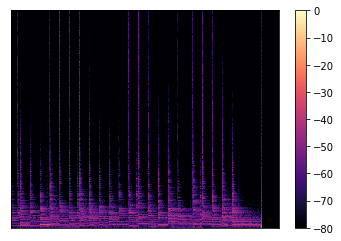

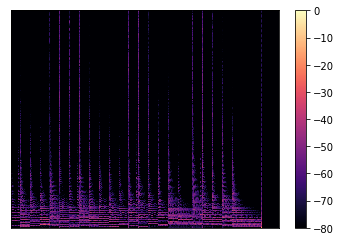

In [114]:
FFT_window_size=2048
frame_size=2048
hop_size=frame_size/4
STFT=librosa.core.stft(res,n_fft=2048)

S_db = librosa.amplitude_to_db(np.abs(STFT), ref=np.max)
plt.figure()
ld.specshow(S_db)
plt.colorbar()


STFT2 = librosa.core.stft(y_out,n_fft=2048)
S_db2 = librosa.amplitude_to_db(np.abs(STFT2), ref=np.max)
plt.figure()
ld.specshow(S_db2)
plt.colorbar()



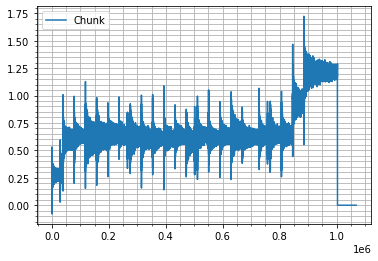

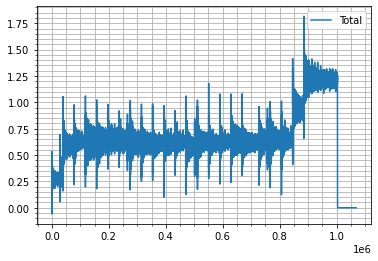

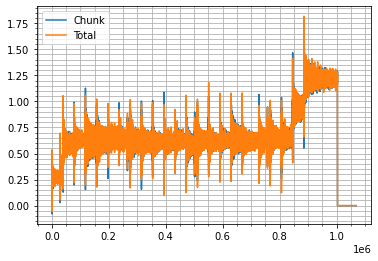

In [115]:
fig1, ax1 = plt.subplots()
ax1.plot(np.arange(len(y)), res, label = 'Chunk')
fig2, ax2 = plt.subplots()
ax2.plot(np.arange(len(y)), y_out, label = 'Total')
fig3, ax3 = plt.subplots()
ax3.plot(np.arange(len(y)), res, label = 'Chunk')
ax3.plot(np.arange(len(y)), y_out, label = 'Total')

ax1.legend()
ax1.minorticks_on()
ax1.grid(which = 'both')

ax2.legend()
ax2.minorticks_on()
ax2.grid(which = 'both')


plt.legend()
plt.minorticks_on()
plt.grid(which = 'both')
plt.show()

In [68]:
stream = p.open(channels = 1, format = pa.paFloat32, rate = fs, output = True)
stream.start_stream()

delay = 15
range_sound = 12
sweep_freq = 0.3125

y_chunk = y[ : chunksize]
y_filt = np.zeros(len(y_chunk))

for j in range(len(y_chunk)-delay-range_sound):
    y_filt[j] = y_chunk[j] + y_chunk[int(j-delay-np.round(range_sound*np.sin(2*np.pi*j*sweep_freq/fs), 0))] 

res = np.zeros(y.size)

res[ : chunksize] = y_filt

i = 1

while len(y_filt) > 0:
    stream.write(y_filt)
    y_chunk = y[i * chunksize : (i + 1) * chunksize]
    y_filt = np.zeros(len(y_chunk))
    for j in range(len(y_chunk)-delay-range_sound):
        y_filt[j] = y_chunk[j] + y_chunk[int(j-delay-np.round(range_sound*np.sin(2*np.pi*j*sweep_freq/fs)))]
    res[i * chunksize : (i + 1) * chunksize] = y_filt
    if not i%1000: print(i)
    i += 1
    
stream.stop_stream()
stream.close()


1000


In [ ]:
delay = 15
range_sound = 12
sweep_freq = 0.3125

t = delay+np.round(range_sound*np.sin(2*np.pi*j*sweep_freq/fs), 0)

b =



